# Exploratory data analysis

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import glob
import os

## EDA for Apartments files

In [2]:
# Specify the folder containing the CSV files
folder_path_apartments = r'C:\MLProjects\poland_house_price_prediction\csv\apartments'

# Use glob to find all CSV files in the folder
csv_files = glob.glob(os.path.join(folder_path_apartments, '*.csv'))

# A list to hold DataFrames
dataframes = []

# Iterate over the list of CSV files and read each one into a DataFrame
for file in csv_files:
    df = pd.read_csv(file)
    dataframes.append(df)


# Concatenate them into a single DataFrame
df_apartments = pd.concat(dataframes, ignore_index=True)

# Display the combined DataFrame
df_apartments.head()


,id,city,type,squareMeters,rooms,floor,floorCount,buildYear,latitude,longitude,...,pharmacyDistance,ownership,buildingMaterial,condition,hasParkingSpace,hasBalcony,hasElevator,hasSecurity,hasStorageRoom,price
0,f8524536d4b09a0c8ccc0197ec9d7bde,szczecin,blockOfFlats,63.00,3.0,4.0,10.0,1980.0,53.378933,14.625296,...,0.413,condominium,concreteSlab,NaN,yes,yes,yes,no,yes,415000
1,accbe77d4b360fea9735f138a50608dd,szczecin,blockOfFlats,36.00,2.0,8.0,10.0,NaN,53.442692,14.559690,...,0.205,cooperative,concreteSlab,NaN,no,yes,yes,no,yes,395995
2,8373aa373dbc3fe7ca3b7434166b8766,szczecin,tenement,73.02,3.0,2.0,3.0,NaN,53.452222,14.553333,...,0.280,condominium,brick,NaN,no,no,no,no,no,565000
3,0a68cd14c44ec5140143ece75d739535,szczecin,tenement,87.60,3.0,2.0,3.0,NaN,53.435100,14.532900,...,0.087,condominium,brick,NaN,yes,yes,no,no,yes,640000
4,f66320e153c2441edc0fe293b54c8aeb,szczecin,blockOfFlats,66.00,3.0,1.0,3.0,NaN,53.410278,14.503611,...,0.514,condominium,NaN,NaN,no,no,no,no,no,759000


In [3]:
df_apartments.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 195568 entries, 0 to 195567
Data columns (total 28 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   id                    195568 non-null  object 
 1   city                  195568 non-null  object 
 2   type                  153307 non-null  object 
 3   squareMeters          195568 non-null  float64
 4   rooms                 195568 non-null  float64
 5   floor                 160974 non-null  float64
 6   floorCount            193185 non-null  float64
 7   buildYear             163352 non-null  float64
 8   latitude              195568 non-null  float64
 9   longitude             195568 non-null  float64
 10  centreDistance        195568 non-null  float64
 11  poiCount              195568 non-null  float64
 12  schoolDistance        195400 non-null  float64
 13  clinicDistance        194840 non-null  float64
 14  postOfficeDistance    195320 non-null  float64
 15  

In [4]:
df_apartments.isnull().sum()

id                           0
city                         0
type                     42261
squareMeters                 0
rooms                        0
floor                    34594
floorCount                2383
buildYear                32216
latitude                     0
longitude                    0
centreDistance               0
poiCount                     0
schoolDistance             168
clinicDistance             728
postOfficeDistance         248
kindergartenDistance       207
restaurantDistance         479
collegeDistance           5436
pharmacyDistance           277
ownership                    0
buildingMaterial         77382
condition               146307
hasParkingSpace              0
hasBalcony                   0
hasElevator               9702
hasSecurity                  0
hasStorageRoom               0
price                        0
dtype: int64

In [5]:
df_apartments.shape

(195568, 28)

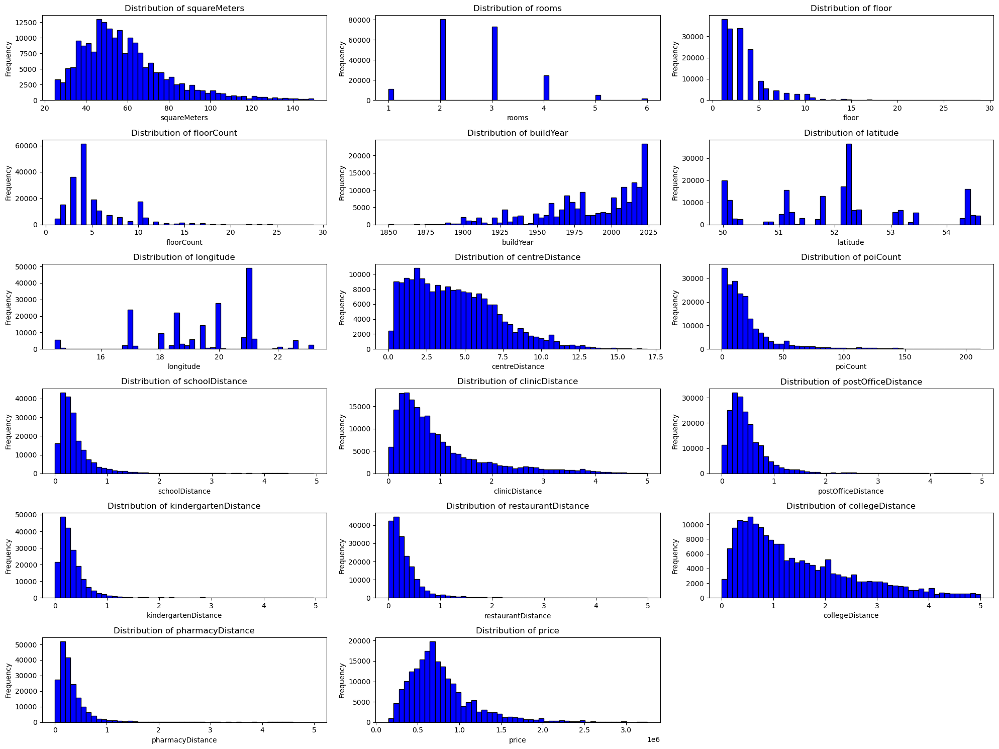

In [6]:
# KDE plots for all numerical features
numerical_features = df_apartments.select_dtypes(include=['float64', 'int64']).columns

# Number of rows and columns for the subplots
num_features = len(numerical_features)
num_cols = 3  # You can adjust this number to change the number of columns
num_rows = (num_features + num_cols - 1) // num_cols  # Calculate the number of rows needed

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 15))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Plot histograms for each numerical feature
for i, feature in enumerate(numerical_features):
    axes[i].hist(df_apartments[feature], bins=50, color='blue', edgecolor='black')
    axes[i].set_title(f'Distribution of {feature}')
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel('Frequency')

# Remove any empty subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


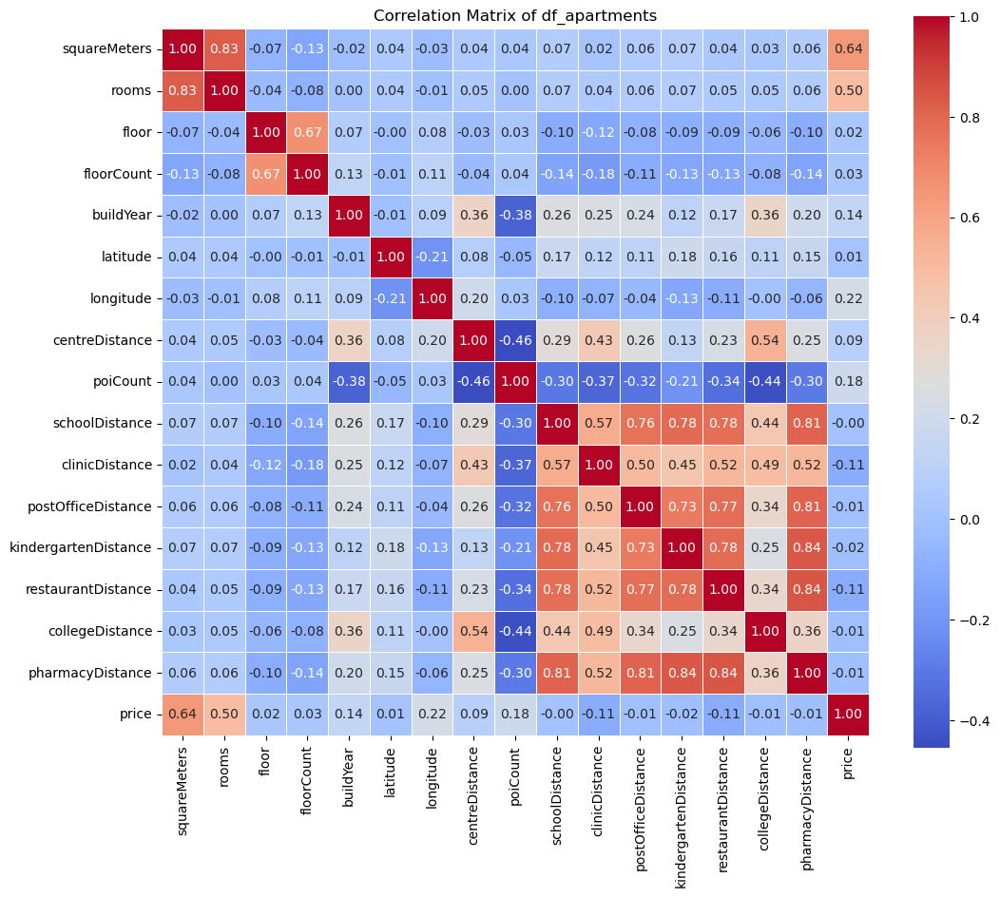

C:\Users\aliyu\AppData\Local\Temp\ipykernel_19276\2890960710.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=target_corr.values, y=target_corr.index, palette='coolwarm')


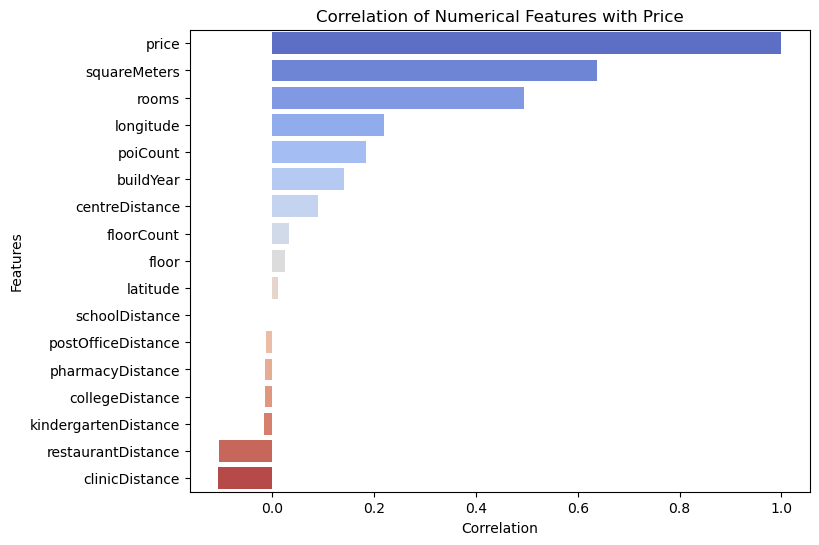

In [8]:
numerical_features = df_apartments.select_dtypes(include=[np.number]).columns.tolist()
corr_matrix = df_apartments[numerical_features].corr()

# Set up the matplotlib figure
plt.figure(figsize=(12, 10))

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True, linewidths=.5)
plt.title('Correlation Matrix of df_apartments')
plt.show()

# Correlation with the target variable
target_corr = corr_matrix['price'].sort_values(ascending=False)

# Plotting the correlation with the target variable
plt.figure(figsize=(8, 6))
sns.barplot(x=target_corr.values, y=target_corr.index, palette='coolwarm')
plt.title('Correlation of Numerical Features with Price')
plt.xlabel('Correlation')
plt.ylabel('Features')
plt.show()

## EDA for Renting  files

In [10]:
# Specify the folder containing the CSV files
folder_path_apartments = r'C:\MLProjects\poland_house_price_prediction\csv\rent'

# Use glob to find all CSV files in the folder
csv_files = glob.glob(os.path.join(folder_path_apartments, '*.csv'))

# A list to hold DataFrames
dataframes = []

# Iterate over the list of CSV files and read each one into a DataFrame
for file in csv_files:
    df = pd.read_csv(file)
    dataframes.append(df)


# Concatenate them into a single DataFrame
df_rent = pd.concat(dataframes, ignore_index=True)

# Display the combined DataFrame
df_rent.head()


,id,city,type,squareMeters,rooms,floor,floorCount,buildYear,latitude,longitude,...,pharmacyDistance,ownership,buildingMaterial,condition,hasParkingSpace,hasBalcony,hasElevator,hasSecurity,hasStorageRoom,price
0,2a1a6db97ff122d6bc148abb6f0e498a,szczecin,blockOfFlats,52.0,2.0,3.0,3.0,2008.0,53.460535,14.545416,...,0.307,condominium,brick,NaN,yes,yes,no,no,no,3500
1,5a0cb42c088eadf75aa98a4118640048,szczecin,blockOfFlats,57.0,3.0,NaN,10.0,1976.0,53.440955,14.566024,...,0.189,condominium,NaN,premium,no,yes,yes,no,no,3000
2,996722490efcb4b34d48bb84a9a72838,szczecin,NaN,43.4,2.0,3.0,4.0,NaN,53.435746,14.560764,...,0.211,condominium,NaN,NaN,no,yes,no,no,no,1900
3,50d75c688530b9a61ba505301e0b94a9,szczecin,apartmentBuilding,32.6,2.0,5.0,6.0,2021.0,53.421582,14.541572,...,0.192,condominium,brick,premium,no,yes,yes,no,no,2500
4,9b187f4203adabf466fd08610d8f4e5e,szczecin,apartmentBuilding,72.0,3.0,6.0,6.0,2014.0,53.450010,14.547230,...,0.315,condominium,brick,premium,no,yes,yes,no,yes,2999


In [11]:
df_rent.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70847 entries, 0 to 70846
Data columns (total 28 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   id                    70847 non-null  object 
 1   city                  70847 non-null  object 
 2   type                  54085 non-null  object 
 3   squareMeters          70847 non-null  float64
 4   rooms                 70847 non-null  float64
 5   floor                 62234 non-null  float64
 6   floorCount            69468 non-null  float64
 7   buildYear             51165 non-null  float64
 8   latitude              70847 non-null  float64
 9   longitude             70847 non-null  float64
 10  centreDistance        70847 non-null  float64
 11  poiCount              70847 non-null  float64
 12  schoolDistance        70832 non-null  float64
 13  clinicDistance        70797 non-null  float64
 14  postOfficeDistance    70821 non-null  float64
 15  kindergartenDistanc

In [12]:
df_rent.shape

(70847, 28)

In [13]:
df_rent.describe()

,squareMeters,rooms,floor,floorCount,buildYear,latitude,longitude,centreDistance,poiCount,schoolDistance,clinicDistance,postOfficeDistance,kindergartenDistance,restaurantDistance,collegeDistance,pharmacyDistance,price
count,70847.000000,70847.000000,62234.000000,69468.000000,51165.000000,70847.000000,70847.000000,70847.000000,70847.000000,70832.000000,70797.000000,70821.000000,70804.000000,70693.000000,69973.000000,70767.000000,70847.000000
mean,55.252692,2.384942,3.419787,5.686906,1998.109293,51.785566,19.691005,3.856228,25.207983,0.368818,0.776294,0.470210,0.327194,0.260977,1.286804,0.308887,3852.796886
std,22.688973,0.872078,2.647224,3.461192,30.292490,1.183777,1.675260,2.609485,27.050432,0.341474,0.724202,0.389788,0.321697,0.318860,1.016936,0.327246,2381.540981
min,25.000000,1.000000,1.000000,1.000000,1850.000000,49.982150,14.447100,0.020000,0.000000,0.002000,0.001000,0.001000,0.001000,0.001000,0.004000,0.001000,346.000000
25%,40.000000,2.000000,2.000000,4.000000,1984.000000,51.078600,18.651526,1.770000,9.000000,0.174000,0.302000,0.235000,0.153000,0.087000,0.520000,0.136000,2500.000000
50%,50.000000,2.000000,3.000000,5.000000,2010.000000,52.185642,19.958724,3.380000,17.000000,0.285000,0.550000,0.388000,0.259000,0.180000,0.971000,0.231000,3100.000000
75%,64.000000,3.000000,4.000000,7.000000,2020.000000,52.250101,21.005240,5.420000,30.000000,0.449000,0.970000,0.585000,0.401000,0.329000,1.809000,0.382000,4490.000000
max,150.000000,6.000000,30.000000,30.000000,2024.000000,54.581756,23.199087,16.620000,210.000000,4.856000,4.990000,4.939000,4.751000,4.961000,5.000000,4.986000,23000.000000


In [11]:
df_rent.isnull().sum()

id                          0
city                        0
type                    16762
squareMeters                0
rooms                       0
floor                    8613
floorCount               1379
buildYear               19682
latitude                    0
longitude                   0
centreDistance              0
poiCount                    0
schoolDistance             15
clinicDistance             50
postOfficeDistance         26
kindergartenDistance       43
restaurantDistance        154
collegeDistance           874
pharmacyDistance           80
ownership                   0
buildingMaterial        28997
condition               51665
hasParkingSpace             0
hasBalcony                  0
hasElevator              3924
hasSecurity                 0
hasStorageRoom              0
price                       0
dtype: int64

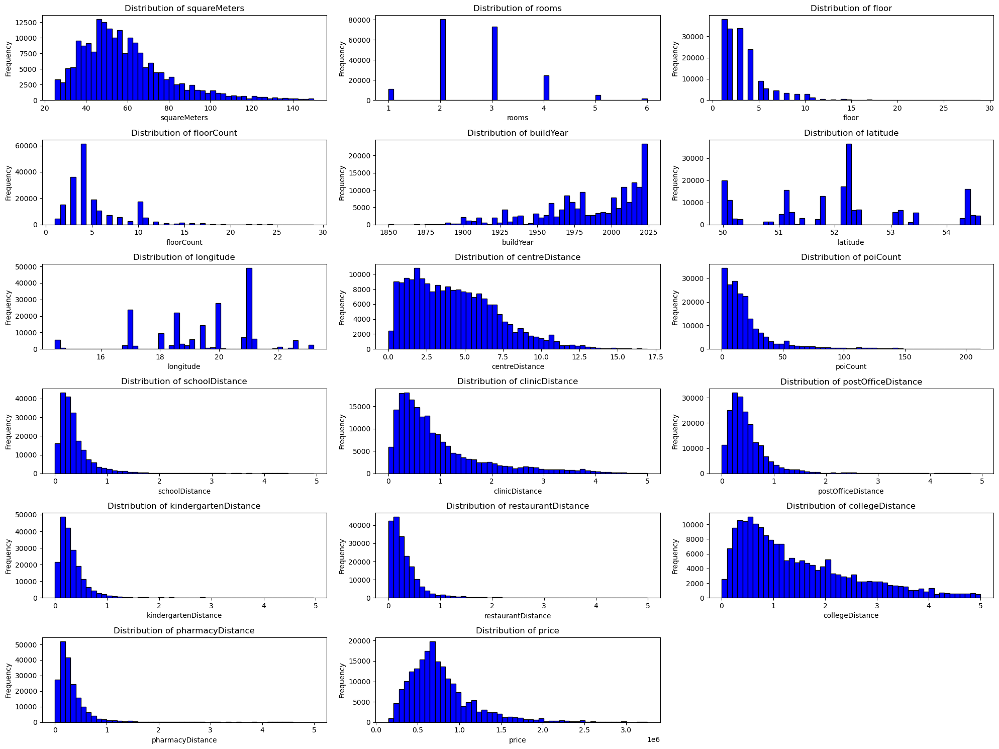

In [21]:
# KDE plots for all numerical features
numerical_features = df_rent.select_dtypes(include=['float64', 'int64']).columns

# Number of rows and columns for the subplots
num_features = len(numerical_features)
num_cols = 3  # You can adjust this number to change the number of columns
num_rows = (num_features + num_cols - 1) // num_cols  # Calculate the number of rows needed

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 15))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Plot histograms for each numerical feature
for i, feature in enumerate(numerical_features):
    axes[i].hist(df_apartments[feature], bins=50, color='blue', edgecolor='black')
    axes[i].set_title(f'Distribution of {feature}')
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel('Frequency')

# Remove any empty subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


c:\Users\aliyu\anaconda3\envs\mlops\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


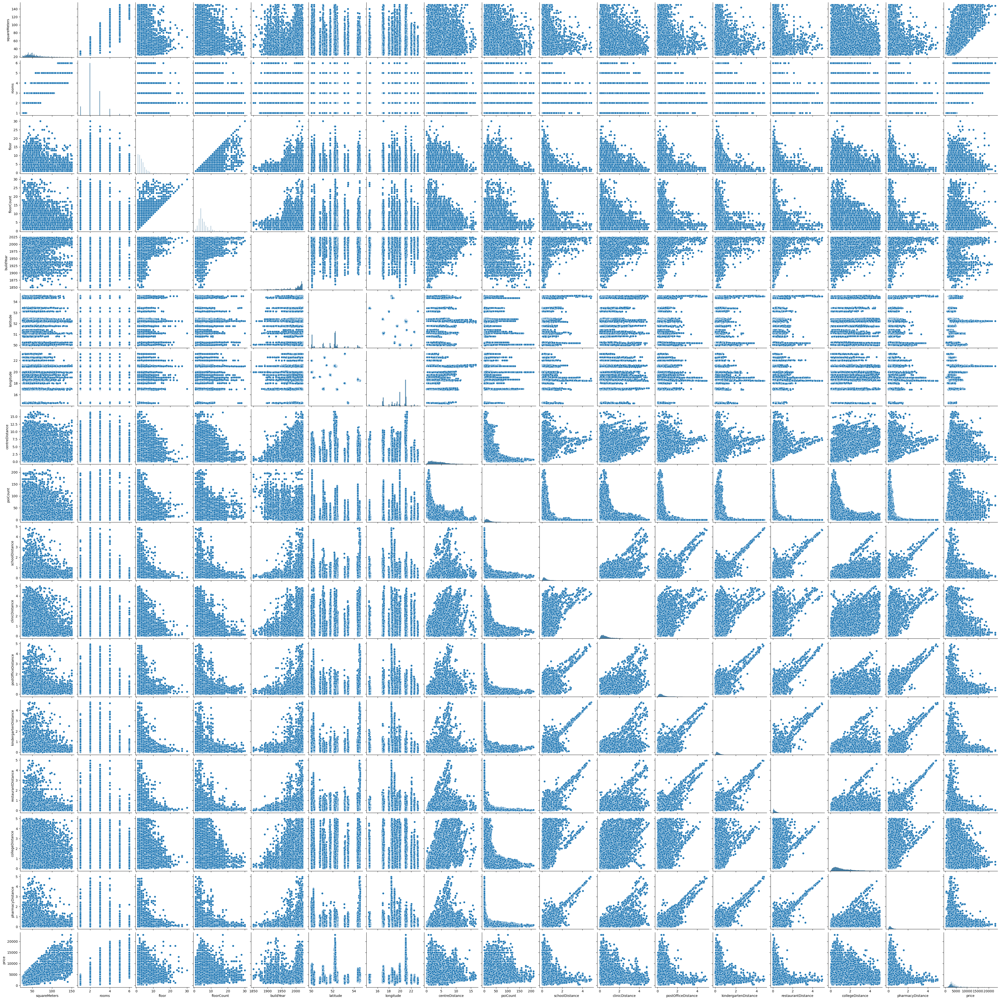

In [22]:
# Create pair plots for numerical features
# Select numerical features
numerical_features = df_rent.select_dtypes(include=['float64', 'int64'])

# Create pair plots for numerical features
sns.pairplot(numerical_features)
plt.show()

In [23]:
# Compare the columns in the two DataFrames

apartments_columns = pd.DataFrame(df_apartments.columns, columns=["df_apartments Columns"])
rent_columns = pd.DataFrame(df_rent.columns, columns=["df_rent Columns"])

# Combine the two DataFrames for display
combined_columns = pd.concat([apartments_columns, rent_columns], axis=1)

# Display the combined columns as a table
print(combined_columns)

   df_apartments Columns       df_rent Columns
0                     id                    id
1                   city                  city
2                   type                  type
3           squareMeters          squareMeters
4                  rooms                 rooms
5                  floor                 floor
6             floorCount            floorCount
7              buildYear             buildYear
8               latitude              latitude
9              longitude             longitude
10        centreDistance        centreDistance
11              poiCount              poiCount
12        schoolDistance        schoolDistance
13        clinicDistance        clinicDistance
14    postOfficeDistance    postOfficeDistance
15  kindergartenDistance  kindergartenDistance
16    restaurantDistance    restaurantDistance
17       collegeDistance       collegeDistance
18      pharmacyDistance      pharmacyDistance
19             ownership             ownership
20      build

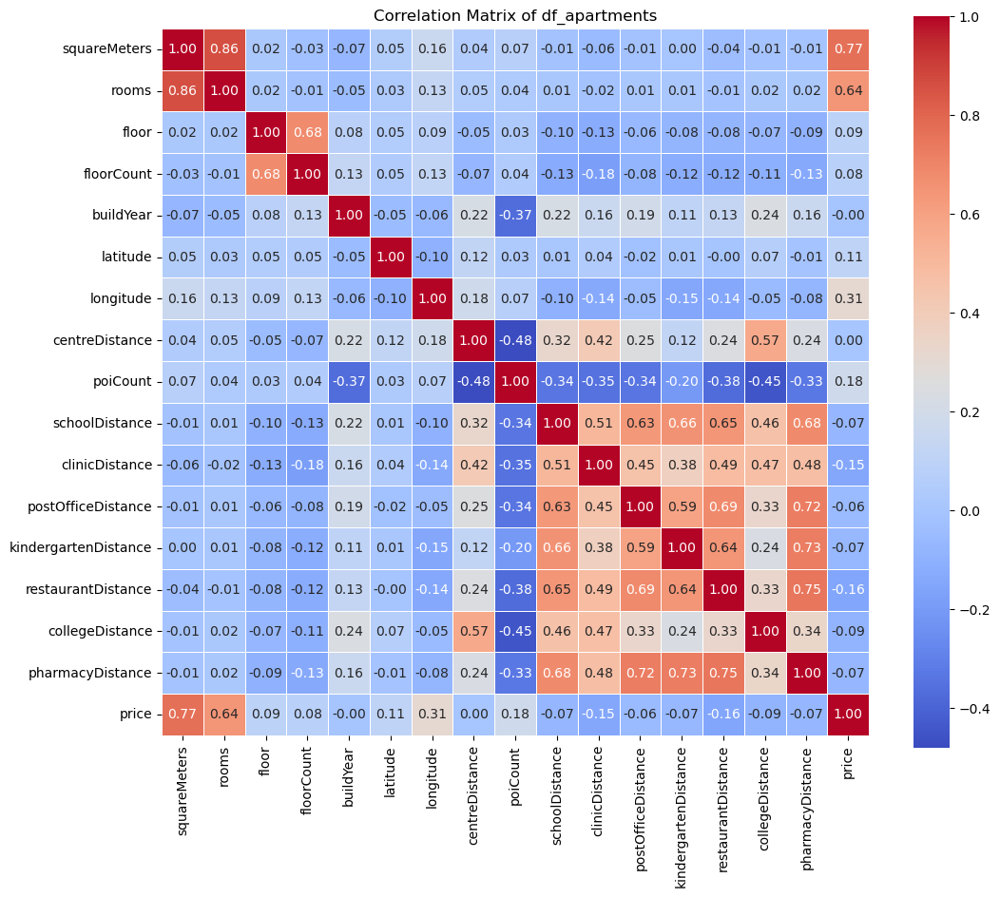

C:\Users\aliyu\AppData\Local\Temp\ipykernel_19276\487523269.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=target_corr.values, y=target_corr.index, palette='coolwarm')


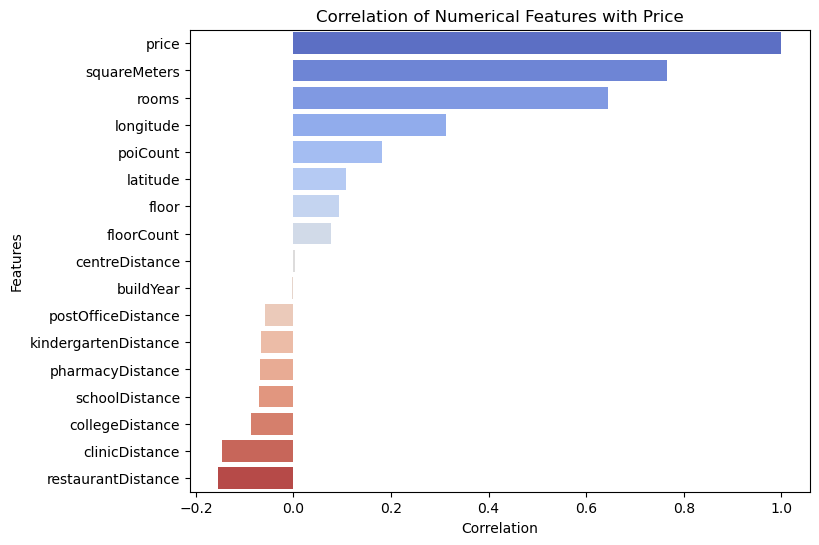

In [14]:
numerical_features = df_rent.select_dtypes(include=[np.number]).columns.tolist()
corr_matrix = df_rent[numerical_features].corr()

# Set up the matplotlib figure
plt.figure(figsize=(12, 10))

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True, linewidths=.5)
plt.title('Correlation Matrix of df_apartments')
plt.show()

# Correlation with the target variable
target_corr = corr_matrix['price'].sort_values(ascending=False)

# Plotting the correlation with the target variable
plt.figure(figsize=(8, 6))
sns.barplot(x=target_corr.values, y=target_corr.index, palette='coolwarm')
plt.title('Correlation of Numerical Features with Price')
plt.xlabel('Correlation')
plt.ylabel('Features')
plt.show()

In [27]:
#save the datasets to csv files
df_apartments.to_csv(r'C:\Users\aliyu\OneDrive\İş masası\poland_house_price_prediction\data\raw\housing\combined\\apartments.csv', index=False)
df_rent.to_csv(r'C:\Users\aliyu\OneDrive\İş masası\poland_house_price_prediction\data\raw\rent\combined\\rent.csv', index=False)

# Feature engineering

In [20]:
df_apartments.columns, df_rent.columns

(Index(['id', 'city', 'type', 'squareMeters', 'rooms', 'floor', 'floorCount',
        'buildYear', 'latitude', 'longitude', 'centreDistance', 'poiCount',
        'schoolDistance', 'clinicDistance', 'postOfficeDistance',
        'kindergartenDistance', 'restaurantDistance', 'collegeDistance',
        'pharmacyDistance', 'ownership', 'buildingMaterial', 'condition',
        'hasParkingSpace', 'hasBalcony', 'hasElevator', 'hasSecurity',
        'hasStorageRoom', 'price'],
       dtype='object'),
 Index(['id', 'city', 'type', 'squareMeters', 'rooms', 'floor', 'floorCount',
        'buildYear', 'latitude', 'longitude', 'centreDistance', 'poiCount',
        'schoolDistance', 'clinicDistance', 'postOfficeDistance',
        'kindergartenDistance', 'restaurantDistance', 'collegeDistance',
        'pharmacyDistance', 'ownership', 'buildingMaterial', 'condition',
        'hasParkingSpace', 'hasBalcony', 'hasElevator', 'hasSecurity',
        'hasStorageRoom', 'price'],
       dtype='object'))

In [21]:
df_apartments['city'].unique(), df_rent['city'].unique()

(array(['szczecin', 'gdynia', 'krakow', 'poznan', 'bialystok', 'gdansk',
        'wroclaw', 'radom', 'rzeszow', 'lodz', 'katowice', 'lublin',
        'czestochowa', 'warszawa', 'bydgoszcz'], dtype=object),
 array(['szczecin', 'gdynia', 'krakow', 'poznan', 'bialystok', 'gdansk',
        'wroclaw', 'radom', 'rzeszow', 'lodz', 'katowice', 'lublin',
        'czestochowa', 'warszawa', 'bydgoszcz'], dtype=object))

In [22]:
df_apartments['city'].value_counts(), df_rent['city'].value_counts()

(city
 warszawa       59246
 krakow         29026
 wroclaw        20200
 gdansk         19210
 lodz           15300
 bydgoszcz       9547
 gdynia          8164
 poznan          7705
 szczecin        6331
 lublin          5704
 katowice        5284
 radom           2929
 czestochowa     2657
 bialystok       2464
 rzeszow         1801
 Name: count, dtype: int64,
 city
 warszawa       28414
 krakow         12661
 wroclaw         6676
 lodz            5214
 poznan          3890
 gdansk          3595
 katowice        2669
 gdynia          1483
 szczecin        1482
 bydgoszcz       1478
 lublin          1313
 czestochowa      661
 rzeszow          614
 bialystok        440
 radom            257
 Name: count, dtype: int64)

In [24]:
#null values
df_apartments['city'].isnull().sum(), df_rent['city'].isnull().sum()

(0, 0)

In [25]:
#type column
df_apartments['type'].unique(), df_rent['type'].unique()

(array(['blockOfFlats', 'tenement', 'apartmentBuilding', nan], dtype=object),
 array(['blockOfFlats', nan, 'apartmentBuilding', 'tenement'], dtype=object))

In [26]:
df_apartments['type'].value_counts(), df_rent['type'].value_counts()

(type
 blockOfFlats         91368
 apartmentBuilding    32507
 tenement             29432
 Name: count, dtype: int64,
 type
 apartmentBuilding    23910
 blockOfFlats         22713
 tenement              7462
 Name: count, dtype: int64)

In [27]:
#null values
df_apartments['type'].isnull().sum(), df_rent['type'].isnull().sum()

(42261, 16762)

In [28]:
#percentage of missing values in type column
df_apartments['type'].isnull().sum() / len(df_apartments) * 100, df_rent['type'].isnull().sum() / len(df_rent) * 100

(21.609363495050317, 23.659435120753173)

In [30]:
# squareMeters column
df_apartments['squareMeters'].describe(), df_rent['squareMeters'].describe()

(count    195568.000000
 mean         58.697667
 std          21.407206
 min          25.000000
 25%          44.000000
 50%          54.600000
 75%          68.550000
 max         150.000000
 Name: squareMeters, dtype: float64,
 count    70847.000000
 mean        55.252692
 std         22.688973
 min         25.000000
 25%         40.000000
 50%         50.000000
 75%         64.000000
 max        150.000000
 Name: squareMeters, dtype: float64)

In [31]:
df_apartments['squareMeters'].isnull().sum(), df_rent['squareMeters'].isnull().sum()

(0, 0)

In [33]:
# rooms column
df_apartments['rooms'].describe(), df_rent['rooms'].describe()

(count    195568.000000
 mean          2.679222
 std           0.915024
 min           1.000000
 25%           2.000000
 50%           3.000000
 75%           3.000000
 max           6.000000
 Name: rooms, dtype: float64,
 count    70847.000000
 mean         2.384942
 std          0.872078
 min          1.000000
 25%          2.000000
 50%          2.000000
 75%          3.000000
 max          6.000000
 Name: rooms, dtype: float64)

In [34]:
#null values
df_apartments['rooms'].isnull().sum(), df_rent['rooms'].isnull().sum()

(0, 0)

In [36]:
# floor column
df_apartments['floor'].describe(), df_rent['floor'].describe()

(count    160974.000000
 mean          3.332414
 std           2.531684
 min           1.000000
 25%           2.000000
 50%           3.000000
 75%           4.000000
 max          29.000000
 Name: floor, dtype: float64,
 count    62234.000000
 mean         3.419787
 std          2.647224
 min          1.000000
 25%          2.000000
 50%          3.000000
 75%          4.000000
 max         30.000000
 Name: floor, dtype: float64)

In [37]:
#null values
df_apartments['floor'].isnull().sum(), df_rent['floor'].isnull().sum()

(34594, 8613)

In [38]:
#percentage of missing values in floor column
df_apartments['floor'].isnull().sum() / len(df_apartments) * 100, df_rent['floor'].isnull().sum() / len(df_rent) * 100

(17.688987973492594, 12.157183790421614)

In [41]:
#type of the floor column
df_apartments['floor'].dtype, df_rent['floor'].dtype

(dtype('float64'), dtype('float64'))

In [44]:
#floorCount column
df_apartments['floorCount'].describe(), df_rent['floorCount'].describe()

(count    193185.000000
 mean          5.309113
 std           3.312234
 min           1.000000
 25%           3.000000
 50%           4.000000
 75%           6.000000
 max          29.000000
 Name: floorCount, dtype: float64,
 count    69468.000000
 mean         5.686906
 std          3.461192
 min          1.000000
 25%          4.000000
 50%          5.000000
 75%          7.000000
 max         30.000000
 Name: floorCount, dtype: float64)

In [45]:
#null values
df_apartments['floorCount'].isnull().sum(), df_rent['floorCount'].isnull().sum()

(2383, 1379)

In [46]:
#percentage of missing values in floorCount column
df_apartments['floorCount'].isnull().sum() / len(df_apartments) * 100, df_rent['floorCount'].isnull().sum() / len(df_rent) * 100

(1.2185020044179007, 1.9464479794486713)

In [48]:
# buildYear column
df_apartments['buildYear'].describe(), df_rent['buildYear'].describe()

(count    163352.000000
 mean       1985.976346
 std          33.812810
 min        1850.000000
 25%        1967.000000
 50%        1994.000000
 75%        2016.000000
 max        2024.000000
 Name: buildYear, dtype: float64,
 count    51165.000000
 mean      1998.109293
 std         30.292490
 min       1850.000000
 25%       1984.000000
 50%       2010.000000
 75%       2020.000000
 max       2024.000000
 Name: buildYear, dtype: float64)

In [49]:
#null values and percentage of missing values in buildYear column
df_apartments['buildYear'].isnull().sum(), df_rent['buildYear'].isnull().sum(), df_apartments['buildYear'].isnull().sum() / len(df_apartments) * 100, df_rent['buildYear'].isnull().sum() / len(df_rent) * 100

(32216, 19682, 16.473042624560254, 27.78099284373368)

In [51]:
df_apartments.columns, df_rent.columns


(Index(['id', 'city', 'type', 'squareMeters', 'rooms', 'floor', 'floorCount',
        'buildYear', 'latitude', 'longitude', 'centreDistance', 'poiCount',
        'schoolDistance', 'clinicDistance', 'postOfficeDistance',
        'kindergartenDistance', 'restaurantDistance', 'collegeDistance',
        'pharmacyDistance', 'ownership', 'buildingMaterial', 'condition',
        'hasParkingSpace', 'hasBalcony', 'hasElevator', 'hasSecurity',
        'hasStorageRoom', 'price'],
       dtype='object'),
 Index(['id', 'city', 'type', 'squareMeters', 'rooms', 'floor', 'floorCount',
        'buildYear', 'latitude', 'longitude', 'centreDistance', 'poiCount',
        'schoolDistance', 'clinicDistance', 'postOfficeDistance',
        'kindergartenDistance', 'restaurantDistance', 'collegeDistance',
        'pharmacyDistance', 'ownership', 'buildingMaterial', 'condition',
        'hasParkingSpace', 'hasBalcony', 'hasElevator', 'hasSecurity',
        'hasStorageRoom', 'price'],
       dtype='object'))

In [54]:
#columns regarding distance 
distance_columns = ['centreDistance', 'schoolDistance', 'clinicDistance', 'postOfficeDistance', 'kindergartenDistance', 'restaurantDistance', 'collegeDistance','pharmacyDistance']
df_apartments[distance_columns].describe(), df_rent[distance_columns].describe()

(       centreDistance  schoolDistance  clinicDistance  postOfficeDistance  \
 count   195568.000000   195400.000000   194840.000000       195320.000000   
 mean         4.351114        0.412651        0.970287            0.516340   
 std          2.835764        0.464193        0.888884            0.498013   
 min          0.010000        0.002000        0.001000            0.001000   
 25%          2.010000        0.176000        0.356000            0.239000   
 50%          3.980000        0.290000        0.676000            0.393000   
 75%          6.150000        0.468000        1.237000            0.623000   
 max         16.940000        4.946000        4.999000            4.970000   
 
        kindergartenDistance  restaurantDistance  collegeDistance  \
 count         195361.000000       195089.000000     190132.00000   
 mean               0.367560            0.345257          1.44327   
 std                0.444673            0.463510          1.10457   
 min                

In [55]:
#null values
df_apartments[distance_columns].isnull().sum(), df_rent[distance_columns].isnull().sum()

(centreDistance             0
 schoolDistance           168
 clinicDistance           728
 postOfficeDistance       248
 kindergartenDistance     207
 restaurantDistance       479
 collegeDistance         5436
 pharmacyDistance         277
 dtype: int64,
 centreDistance            0
 schoolDistance           15
 clinicDistance           50
 postOfficeDistance       26
 kindergartenDistance     43
 restaurantDistance      154
 collegeDistance         874
 pharmacyDistance         80
 dtype: int64)

In [56]:
#percentage of missing values in distance columns
df_apartments[distance_columns].isnull().sum() / len(df_apartments) * 100, df_rent[distance_columns].isnull().sum() / len(df_rent) * 100

(centreDistance          0.000000
 schoolDistance          0.085904
 clinicDistance          0.372249
 postOfficeDistance      0.126810
 kindergartenDistance    0.105846
 restaurantDistance      0.244928
 collegeDistance         2.779596
 pharmacyDistance        0.141639
 dtype: float64,
 centreDistance          0.000000
 schoolDistance          0.021172
 clinicDistance          0.070575
 postOfficeDistance      0.036699
 kindergartenDistance    0.060694
 restaurantDistance      0.217370
 collegeDistance         1.233644
 pharmacyDistance        0.112919
 dtype: float64)

In [58]:
# poiCount column
df_apartments['poiCount'].describe(), df_rent['poiCount'].describe()

(count    195568.000000
 mean         20.672037
 std          24.325708
 min           0.000000
 25%           7.000000
 50%          14.000000
 75%          24.000000
 max         212.000000
 Name: poiCount, dtype: float64,
 count    70847.000000
 mean        25.207983
 std         27.050432
 min          0.000000
 25%          9.000000
 50%         17.000000
 75%         30.000000
 max        210.000000
 Name: poiCount, dtype: float64)

In [59]:
#null values
df_apartments['poiCount'].isnull().sum(), df_rent['poiCount'].isnull().sum()

(0, 0)

In [61]:
# ownership column
df_apartments['ownership'].unique(), df_rent['ownership'].unique()

(array(['condominium', 'cooperative', 'udział'], dtype=object),
 array(['condominium'], dtype=object))

In [62]:
#null values 
df_apartments['ownership'].isnull().sum(), df_rent['ownership'].isnull().sum()

(0, 0)

In [63]:
#value count of ownership column
df_apartments['ownership'].value_counts(), df_rent['ownership'].value_counts()

(ownership
 condominium    176123
 cooperative     19433
 udział             12
 Name: count, dtype: int64,
 ownership
 condominium    70847
 Name: count, dtype: int64)

In [65]:
# buildingMaterial column
df_apartments['buildingMaterial'].unique(), df_rent['buildingMaterial'].unique()

(array(['concreteSlab', 'brick', nan], dtype=object),
 array(['brick', nan, 'concreteSlab'], dtype=object))

In [66]:
#null values
df_apartments['buildingMaterial'].isnull().sum(), df_rent['buildingMaterial'].isnull().sum()

(77382, 28997)

In [67]:
#percentage of missing values in buildingMaterial column
df_apartments['buildingMaterial'].isnull().sum() / len(df_apartments) * 100, df_rent['buildingMaterial'].isnull().sum() / len(df_rent) * 100

(39.56782295672094, 40.929044278515676)

In [69]:
# condition column
df_apartments['condition'].unique(), df_rent['condition'].unique()

(array([nan, 'low', 'premium'], dtype=object),
 array([nan, 'premium', 'low'], dtype=object))

In [70]:
#null values
df_apartments['condition'].isnull().sum(), df_rent['condition'].isnull().sum()

(146307, 51665)

In [71]:
#percentage of missing values in condition column
df_apartments['condition'].isnull().sum() / len(df_apartments) * 100, df_rent['condition'].isnull().sum() / len(df_rent) * 100

(74.81131882516567, 72.9247533417082)

In [72]:
#value counts of condition column
df_apartments['condition'].value_counts(), df_rent['condition'].value_counts()

(condition
 premium    27869
 low        21392
 Name: count, dtype: int64,
 condition
 premium    18920
 low          262
 Name: count, dtype: int64)

In [73]:
df_apartments.columns

Index(['id', 'city', 'type', 'squareMeters', 'rooms', 'floor', 'floorCount',
       'buildYear', 'latitude', 'longitude', 'centreDistance', 'poiCount',
       'schoolDistance', 'clinicDistance', 'postOfficeDistance',
       'kindergartenDistance', 'restaurantDistance', 'collegeDistance',
       'pharmacyDistance', 'ownership', 'buildingMaterial', 'condition',
       'hasParkingSpace', 'hasBalcony', 'hasElevator', 'hasSecurity',
       'hasStorageRoom', 'price'],
      dtype='object')

In [74]:
# the columns with "has" prefix
columns_with_has = ['hasParkingSpace', 'hasBalcony', 'hasElevator', 'hasSecurity',
       'hasStorageRoom']

In [75]:
#value counts of columns with "has" prefix
for column in columns_with_has:
    print(df_apartments[column].value_counts(), df_rent[column].value_counts())

hasParkingSpace
no     142410
yes     53158
Name: count, dtype: int64 hasParkingSpace
no     43075
yes    27772
Name: count, dtype: int64
hasBalcony
yes    112049
no      83519
Name: count, dtype: int64 hasBalcony
yes    43506
no     27341
Name: count, dtype: int64
hasElevator
no     93662
yes    92204
Name: count, dtype: int64 hasElevator
yes    44063
no     22860
Name: count, dtype: int64
hasSecurity
no     173630
yes     21938
Name: count, dtype: int64 hasSecurity
no     60614
yes    10233
Name: count, dtype: int64
hasStorageRoom
no     110583
yes     84985
Name: count, dtype: int64 hasStorageRoom
no     59833
yes    11014
Name: count, dtype: int64


In [76]:
#null values of columns with "has" prefix
for column in columns_with_has:
    print(df_apartments[column].isnull().sum(), df_rent[column].isnull().sum())

0 0
0 0
9702 3924
0 0
0 0


In [77]:
#value counts of columns with "has" prefix
for column in columns_with_has:
    print(df_apartments[column].value_counts(), df_rent[column].value_counts())

hasParkingSpace
no     142410
yes     53158
Name: count, dtype: int64 hasParkingSpace
no     43075
yes    27772
Name: count, dtype: int64
hasBalcony
yes    112049
no      83519
Name: count, dtype: int64 hasBalcony
yes    43506
no     27341
Name: count, dtype: int64
hasElevator
no     93662
yes    92204
Name: count, dtype: int64 hasElevator
yes    44063
no     22860
Name: count, dtype: int64
hasSecurity
no     173630
yes     21938
Name: count, dtype: int64 hasSecurity
no     60614
yes    10233
Name: count, dtype: int64
hasStorageRoom
no     110583
yes     84985
Name: count, dtype: int64 hasStorageRoom
no     59833
yes    11014
Name: count, dtype: int64


In [78]:
df_apartments.columns

Index(['id', 'city', 'type', 'squareMeters', 'rooms', 'floor', 'floorCount',
       'buildYear', 'latitude', 'longitude', 'centreDistance', 'poiCount',
       'schoolDistance', 'clinicDistance', 'postOfficeDistance',
       'kindergartenDistance', 'restaurantDistance', 'collegeDistance',
       'pharmacyDistance', 'ownership', 'buildingMaterial', 'condition',
       'hasParkingSpace', 'hasBalcony', 'hasElevator', 'hasSecurity',
       'hasStorageRoom', 'price'],
      dtype='object')

In [79]:
#price column
df_apartments['price'].describe(), df_rent['price'].describe()

(count    1.955680e+05
 mean     7.841833e+05
 std      4.097092e+05
 min      1.500000e+05
 25%      5.200000e+05
 50%      6.990000e+05
 75%      9.300000e+05
 max      3.250000e+06
 Name: price, dtype: float64,
 count    70847.000000
 mean      3852.796886
 std       2381.540981
 min        346.000000
 25%       2500.000000
 50%       3100.000000
 75%       4490.000000
 max      23000.000000
 Name: price, dtype: float64)

In [80]:
df_apartments['price'].isnull().sum(), df_rent['price'].isnull().sum()

(0, 0)